## Dataset creation

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/archive/data/data/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/10554045.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/10926726.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/10873344.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/10070224.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/12237267.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/12567516.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11624880.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11160414.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11902276.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/12545844.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11850315.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/12191094.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11842274.pdf
/content/drive/MyDrive/archive/data/data/PUBLIC-RELATIONS/11635137.pdf
/conte

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/archive/Resume/Resume.csv")
df

,ID,Resume_str,Resume_html,Category
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR
...,...,...,...,...
2479,99416532,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION
2480,24589765,"GOVERNMENT RELATIONS, COMMUNICATIONS ...","<div class=""fontsize fontface vmargins hmargin...",AVIATION
2481,31605080,GEEK SQUAD AGENT Professional...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION
2482,21190805,PROGRAM DIRECTOR / OFFICE MANAGER ...,"<div class=""fontsize fontface vmargins hmargin...",AVIATION


In [ ]:
!pip install PyPDF2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 4.2 MB/s eta 0:00:00


In [ ]:
from PyPDF2 import PdfReader
def extract_text_from_pdf(file_path):
    reader = PdfReader(file_path)
    text = "".join(page.extract_text() for page in reader.pages)
    return text

## Preprocessing of text data

In [ ]:
from nltk import pos_tag, sent_tokenize, word_tokenize
from nltk.corpus import stopwords
import string
import re
def preprocess_text(text):
    text = text.lower()
    text = re.sub('[^a-zA-Z]', ' ', text)
    sentences = sent_tokenize(text)
    features = {'feature': ""}
    stop_words = set(stopwords.words("english"))
    for sent in sentences:
        if any(criteria in sent for criteria in ['skills', 'education']):
            words = word_tokenize(sent)
            words = [word for word in words if word not in stop_words]
            tagged_words = pos_tag(words)
            filtered_words = [word for word, tag in tagged_words if tag not in ['DT', 'IN', 'TO', 'PRP', 'WP']]
            features['feature'] += " ".join(filtered_words)
    return features

In [ ]:
def process_resume_data(df):
    id = df['ID']
    category = df['Category']
    text = extract_text_from_pdf(f"/content/drive/MyDrive/archive/data/data/{category}/{id}.pdf")
    features = preprocess_text(text)
    df['Feature'] = features['feature']
    return df

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

### Preprocessing using the dataframe from both datasets
-We are using 15 job decsriptions here to match with all resumes

In [ ]:
num_desc = 15
resume_data = pd.read_csv("/content/drive/MyDrive/archive/Resume/Resume.csv")
resume_data = resume_data.drop(["Resume_html"], axis=1)
resume_data = resume_data.apply(process_resume_data, axis=1)
resume_data = resume_data.drop(columns=['Resume_str'])
resume_data.to_csv("resume_data.csv", index=False)


job_description = pd.read_csv("/content/drive/MyDrive/archive/training_data/training_data.csv")
job_description = job_description[["job_description", "position_title"]][:num_desc]
job_description['Features'] = job_description['job_description'].apply(lambda x : preprocess_text(x)['feature'])

In [ ]:

job_description = pd.read_csv("/content/drive/MyDrive/archive/training_data/training_data.csv")
job_description = job_description[["job_description", "position_title"]][:num_desc]
job_description['Features'] = job_description['job_description'].apply(lambda x : preprocess_text(x)['feature'])

In [ ]:
categories = np.sort(resume_data['Category'].unique())
categories
# create new df for corpus and category
df_categories = [resume_data[resume_data['Category'] == category].loc[:, ['Feature', 'Category']] for category in categories]

In [ ]:
resume_data

,ID,Category,Feature
0,16852973,HR,hr administrator marketing associate hr admini...
1,22323967,HR,hr specialist hr operations summary media prof...
2,33176873,HR,hr director summary years experience recruitin...
3,27018550,HR,hr specialist summary dedicated driven dynamic...
4,17812897,HR,hr manager skill highlights hr skills hr depar...
...,...,...,...
2479,99416532,AVIATION,rank sgt e non commissioned officer charge bri...
2480,24589765,AVIATION,government relations communications organizati...
2481,31605080,AVIATION,geek squad agent professional profile support ...
2482,21190805,AVIATION,program director office manager summary highly...


In [ ]:
!python -m spacy download en_core_web_sm

# nltk
!python -m nltk.downloader words
!python -m nltk.downloader stopwords

2023-12-08 18:39:48.442097: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-08 18:39:48.442168: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-08 18:39:48.442211: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-08 18:39:48.451289: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-08 18:39:49.698509: W tensorflow/compiler/

In [ ]:
from wordcloud import WordCloud
def wordcloud(df):
    txt = ' '.join(txt for txt in resume_data['Feature'])
    wordcloud = WordCloud(
        height=2000,
        width=4000
    ).generate(txt)

    return wordcloud

In [ ]:
def remove_extra_word(text):

    extra_word=['company', 'name', 'citi', 'state', 'work', 'manag', 'project','program','system','client'] # extra words
    words = text.split()  # Split the text into words

    # Filter out the extra words
    filter_word = [word for word in words if word not in extra_word]

    filter_text = ' '.join(filter_word)

    return filter_text


# apply resume_data['Cleaned_Resume']

resume_data['Feature']=resume_data['Feature'].apply(lambda x:remove_extra_word(x))

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()

resume_data['Category']=encoder.fit_transform(resume_data['Category'])
resume_data.head()

,ID,Category,Feature
0,16852973,19,hr administrator marketing associate hr admini...
1,22323967,19,hr specialist hr operations summary media prof...
2,33176873,19,hr director summary years experience recruitin...
3,27018550,19,hr specialist summary dedicated driven dynamic...
4,17812897,19,hr manager skill highlights hr skills hr depar...


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(resume_data['Feature'], resume_data['Category'], test_size=0.15, random_state=42, stratify=resume_data['Category'])


# Print the sizes of the split datasets
print("Train data size:", X_train.shape)
print("Validation data size:", X_test.shape)

Train data size: (2111,)
Validation data size: (373,)


In [ ]:
job_desc = job_description.drop(['job_description', 'position_title'], axis=1)

## TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf=TfidfVectorizer(stop_words='english',max_features=800)
tfidf_train_vectors = tfidf.fit_transform(X_train)
tfidf_test_vectors =tfidf.transform(X_test)

tfidf_jobDesc_vectors = tfidf.fit_transform(job_desc['Features'])
tfidf_train_vectors

<2111x800 sparse matrix of type '<class 'numpy.float64'>'
	with 331882 stored elements in Compressed Sparse Row format>

In [ ]:
tfidf_jobDesc_vectors_dense = tfidf_jobDesc_vectors.toarray()
tfidf_train_vectors_dense = tfidf_train_vectors.toarray()
tfidf_train_vectors_dense.shape, tfidf_jobDesc_vectors_dense.shape

((2111, 800), (15, 800))

In [ ]:
tfidf.get_feature_names_out()

array(['abilities', 'ability', 'able', 'access', 'account', 'accounts',
       'act', 'action', 'active', 'ada', 'adding', 'additional', 'adobe',
       'adobexd', 'ads', 'advance', 'advanced', 'advertising', 'advocate',
       'aesthetic', 'agency', 'amazing', 'andor', 'annual', 'api', 'apis',
       'apple', 'applicable', 'applicants', 'application', 'applications',
       'applied', 'apply', 'applying', 'apps', 'area', 'art', 'artist',
       'artists', 'assets', 'assigned', 'attention', 'audio',
       'authorized', 'available', 'bachelors', 'backend', 'backgrounds',
       'based', 'basic', 'believe', 'benefits', 'best', 'better',
       'beverage', 'big', 'blogs', 'bonus', 'bootstrap', 'brand',
       'brands', 'bring', 'bringing', 'broad', 'build', 'building',
       'business', 'businessability', 'businesses', 'businessexperience',
       'calendars', 'campaigns', 'canada', 'candidate', 'candidates',
       'capabilities', 'capable', 'capacity', 'career', 'catalog',
       'cat

### Cosine similarity
Displaying only top resume IDs for 15 JDs selected at random

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
k = 5
result_df = pd.DataFrame(columns=['jobId', 'resumeId', 'similarity', 'domainResume', 'domainDesc'])
for i, job_desc_emb in enumerate(tfidf_jobDesc_vectors_dense):
    job_desc_id = i
    job_title = job_description['position_title'].iloc[i]

    # Compute cosine similarities between the current job description and all resumes
    similarities = cosine_similarity([job_desc_emb], tfidf_train_vectors )
    top_k_indices = np.argsort(similarities[0])[::-1][:k]

    # Extract the relevant information and add it to the result DataFrame
    for j in top_k_indices:
        resume_id = resume_data['ID'].iloc[j]
        work_domain = resume_data['Category'].iloc[j]
        similarity_score = similarities[0][j]

        result_df.loc[i+j] = [job_desc_id, resume_id, similarity_score, work_domain,job_title ]


# Sort the results by similarity score (descending)
result_df = result_df.sort_values(by='similarity', ascending=False)

In [ ]:
result_group=result_df.groupby("jobId")
result_group

In [ ]:
# Assuming you have previously used LabelEncoder on 'Category'
from sklearn.preprocessing import LabelEncoder

# Assuming 'Category' is the column you want to encode
encoder = LabelEncoder()
resume_data['Category'] = encoder.fit_transform(resume_data['Category'])

# ... (your existing code)

# Now you should be able to use inverse_transform
result_df['domainResume'] = encoder.inverse_transform(result_df['domainResume'].astype(int))


In [ ]:
num_desc = 15
for i in range(num_desc):
    print()
    print("jobId---cosineSimilarity---domainResume---domainDesc")
    print(result_group.get_group(i).values[0])
    print()


jobId---cosineSimilarity---domainResume---domainDesc
[0 37660306 0.44500434994802296 23 'Sales Specialist']


jobId---cosineSimilarity---domainResume---domainDesc
[1 27409087 0.2313267059537516 16 'Apple Solutions Consultant']


jobId---cosineSimilarity---domainResume---domainDesc
[2 10840430 0.21557575442851945 20
 'Licensing Coordinator - Consumer Products']


jobId---cosineSimilarity---domainResume---domainDesc
[3 28758002 0.259291805979728 16 'Web Designer']


jobId---cosineSimilarity---domainResume---domainDesc
[4 12802330 0.3480936926545201 0 'Web Developer']


jobId---cosineSimilarity---domainResume---domainDesc
[5 25497147 0.4135561832152992 16 'Frontend Web Developer']


jobId---cosineSimilarity---domainResume---domainDesc
[6 10265057 0.24720053990075475 20 'Remote Website Designer']


jobId---cosineSimilarity---domainResume---domainDesc
[7 21321598 0.0 21 'Web Designer']


jobId---cosineSimilarity---domainResume---domainDesc
[8 11958994 0.2891734120077276 13 'Web Designer']


### Displaying top-10 resumes for every specific job ID

In [ ]:
import numpy as np
import pandas as pd
import os
from PyPDF2 import PdfReader
from nltk import pos_tag, sent_tokenize, word_tokenize
from nltk.corpus import stopwords
import string
import re
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib

# Function to extract text from PDF
def extract_text_from_pdf(file_path):
    reader = PdfReader(file_path)
    text = "".join(page.extract_text() for page in reader.pages)
    return text

# Function to preprocess text
def preprocess_text(text):
    text = text.lower()
    text = re.sub('[^a-zA-Z]', ' ', text)
    sentences = sent_tokenize(text)
    features = {'feature': ""}
    stop_words = set(stopwords.words("english"))
    for sent in sentences:
        if any(criteria in sent for criteria in ['skills', 'education']):
            words = word_tokenize(sent)
            words = [word for word in words if word not in stop_words]
            tagged_words = pos_tag(words)
            filtered_words = [word for word, tag in tagged_words if tag not in ['DT', 'IN', 'TO', 'PRP', 'WP']]
            features['feature'] += " ".join(filtered_words)
    return features

# Function to process resume data
def process_resume_data(df):
    id = df['ID']
    category = df['Category']
    text = extract_text_from_pdf(f"/content/drive/MyDrive/archive/data/data/{category}/{id}.pdf")
    features = preprocess_text(text)
    df['Feature'] = features['feature']
    return df

# Read and preprocess resume data
resume_data = pd.read_csv("/content/drive/MyDrive/archive/Resume/Resume.csv")
resume_data = resume_data.drop(["Resume_html"], axis=1)
resume_data = resume_data.apply(process_resume_data, axis=1)
resume_data = resume_data.drop(columns=['Resume_str'])

# Read and preprocess job description data
num_desc = 800
job_description = pd.read_csv("/content/drive/MyDrive/archive/training_data/training_data.csv")
job_description = job_description[["job_description", "position_title"]][:num_desc]
job_description['Features'] = job_description['job_description'].apply(lambda x: preprocess_text(x)['feature'])

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(resume_data['Feature'], resume_data['Category'], test_size=0.15, random_state=42, stratify=resume_data['Category'])

# Print the sizes of the split datasets
print("Train data size:", X_train.shape)
print("Validation data size:", X_test.shape)

# Create TF-IDF vectors
tfidf = TfidfVectorizer(stop_words='english', max_features=800)
tfidf_train_vectors = tfidf.fit_transform(X_train)
tfidf_test_vectors = tfidf.transform(X_test)
tfidf_jobDesc_vectors = tfidf.fit_transform(job_description['Features'])
tfidf_train_vectors_dense = tfidf_train_vectors.toarray()
tfidf_jobDesc_vectors_dense = tfidf_jobDesc_vectors.toarray()

# Fit and save the LabelEncoder
encoder = LabelEncoder()
resume_data['Category'] = encoder.fit_transform(resume_data['Category'])
encoder_filename = 'label_encoder.joblib'
joblib.dump(encoder, encoder_filename)

# Load the fitted LabelEncoder back
encoder = joblib.load(encoder_filename)

# Compute cosine similarities and get the top ten most similar resumes for each job description
k = 10
result_df = pd.DataFrame(columns=['jobId', 'resumeId', 'similarity', 'domainResume', 'domainDesc'])
for i, job_desc_emb in enumerate(tfidf_jobDesc_vectors_dense):
    job_desc_id = i
    job_title = job_description['position_title'].iloc[i]

    # Compute cosine similarities between the current job description and all resumes
    similarities = cosine_similarity([job_desc_emb], tfidf_train_vectors)
    top_k_indices = np.argsort(similarities[0])[::-1][:k]

    # Extract the relevant information and add it to the result DataFrame
    for j in top_k_indices:
        resume_id = resume_data['ID'].iloc[j]
        work_domain = resume_data['Category'].iloc[j]
        similarity_score = similarities[0][j]

        result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)

# Sort the results by job ID and similarity score (descending)
result_df = result_df.sort_values(by=['jobId', 'similarity'], ascending=[True, False])

# Transform numeric categories back to their names
result_df['domainResume'] = encoder.inverse_transform(result_df['domainResume'].astype(int))

# Display the result
result_group = result_df.groupby("jobId")
for i in range(num_desc):
    print()
    print(f"Top 10 most similar resumes for Job ID {i}:")
    print(result_group.get_group(i).head(10))
    print()


Train data size: (2111,)
Validation data size: (373,)


Streaming output truncated to the last 5000 lines.
<ipython-input-31-f3c7d08d24cf>:99: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)
<ipython-input-31-f3c7d08d24cf>:99: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)
<ipython-input-31-f3c7d08d24cf>:99: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id,

Streaming output truncated to the last 5000 lines.

Top 10 most similar resumes for Job ID 574:
     jobId  resumeId  similarity            domainResume  \
5740   574  70196518    0.632123           DIGITAL-MEDIA   
5741   574  37292350    0.610637             AGRICULTURE   
5742   574  24455357    0.610171                DESIGNER   
5743   574  19796840    0.588372  INFORMATION-TECHNOLOGY   
5744   574  27066370    0.588333            CONSTRUCTION   
5745   574  60624892    0.575028              HEALTHCARE   
5746   574  35121930    0.572449                 APPAREL   
5747   574  11877150    0.554761                 FINANCE   
5748   574  24219583    0.551939                 FITNESS   
5749   574  70892619    0.549338                 TEACHER   

                         domainDesc  
5740   Construction Project Manager  
5741   Construction Project Manager  
5742   Construction Project Manager  
5743   Construction Project Manager  
5744   Construction Project Manager  
5745   Construc

### Using the TF-IDF for k means clustering and evaluating using silhouette score and davies bouldin score

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.06303813635081822
Davies-Bouldin Index: 3.824260588616969
Adjusted Rand Index (ARI): 0.21158939901211773
Normalized Mutual Information (NMI): 0.40998305826188763


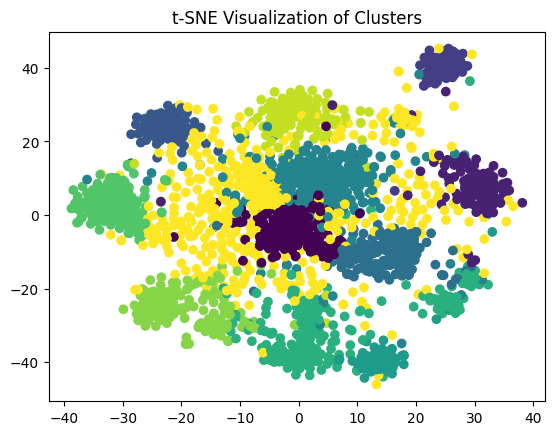

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import joblib

tfidf = TfidfVectorizer(stop_words='english', max_features=800)
tfidf_vectors = tfidf.fit_transform(resume_data['Feature'])

# Apply K-means clustering
kmeans = KMeans(n_clusters=12, random_state=42)
predicted_labels = kmeans.fit_predict(tfidf_vectors)

# Evaluate Clustering

# Internal Metrics
silhouette = silhouette_score(tfidf_vectors, predicted_labels)
db_index = davies_bouldin_score(tfidf_vectors.toarray(), predicted_labels)

# External Metrics (if ground truth labels are available)
# Assuming 'true_labels' represents ground truth labels
true_labels = resume_data['Category']
ari = adjusted_rand_score(true_labels, predicted_labels)
nmi = normalized_mutual_info_score(true_labels, predicted_labels)

print(f"Silhouette Score: {silhouette}")
print(f"Davies-Bouldin Index: {db_index}")
print(f"Adjusted Rand Index (ARI): {ari}")
print(f"Normalized Mutual Information (NMI): {nmi}")

# Visualize Clusters using t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_representation = tsne.fit_transform(tfidf_vectors.toarray())

# Scatter plot of clusters
plt.scatter(tsne_representation[:, 0], tsne_representation[:, 1], c=predicted_labels, cmap='viridis')
plt.title("t-SNE Visualization of Clusters")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


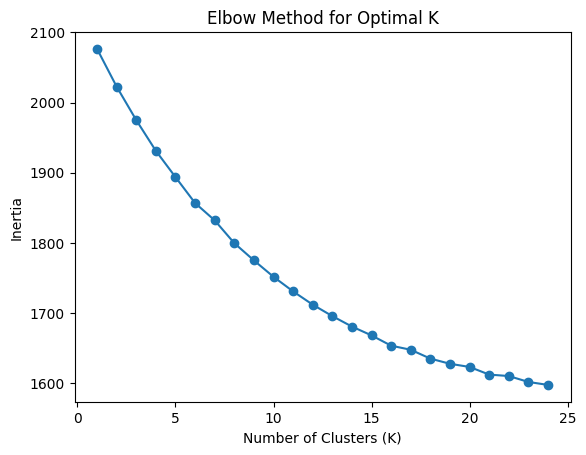

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming tfidf_vectors is your data
inertias = []

# Trying K from 1 to 24
for k in range(1, 25):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tfidf_vectors)
    inertias.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.plot(range(1, 25), inertias, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()


In [37]:
import numpy as np
import pandas as pd
import os
from PyPDF2 import PdfReader
from nltk import pos_tag, sent_tokenize, word_tokenize
from nltk.corpus import stopwords
import string
import re
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
import joblib



# Function to process resume data
def process_resume_data(df):
    id = df['ID']
    category = df['Category']
    text = extract_text_from_pdf(f"/content/drive/MyDrive/archive/data/data/{category}/{id}.pdf")
    features = preprocess_text(text)
    df['Feature'] = features['feature']
    return df

# Read and preprocess resume data
resume_data = pd.read_csv("/content/drive/MyDrive/archive/Resume/Resume.csv")
resume_data = resume_data.drop(["Resume_html"], axis=1)
resume_data = resume_data.apply(process_resume_data, axis=1)
resume_data = resume_data.drop(columns=['Resume_str'])

# Read and preprocess job description data
num_desc = 15
job_description = pd.read_csv("/content/drive/MyDrive/archive/training_data/training_data.csv")
job_description = job_description[["job_description", "position_title"]][:num_desc]
job_description['Features'] = job_description['job_description'].apply(lambda x: preprocess_text(x)['feature'])

# Filter resumes only in the category of "ADVOCATE"
advocate_resumes = resume_data[resume_data['Category'] == 'ENGINEERING']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(advocate_resumes['Feature'], advocate_resumes['Category'], test_size=0.15, random_state=42, stratify=advocate_resumes['Category'])

# Print the sizes of the split datasets
print("Train data size:", X_train.shape)
print("Validation data size:", X_test.shape)

# Create TF-IDF vectors
tfidf = TfidfVectorizer(stop_words='english', max_features=800)
tfidf_train_vectors = tfidf.fit_transform(X_train)
tfidf_test_vectors = tfidf.transform(X_test)
tfidf_jobDesc_vectors = tfidf.fit_transform(job_description['Features'])
tfidf_train_vectors_dense = tfidf_train_vectors.toarray()
tfidf_jobDesc_vectors_dense = tfidf_jobDesc_vectors.toarray()

# Fit and save the LabelEncoder
encoder = LabelEncoder()
advocate_resumes['Category'] = encoder.fit_transform(advocate_resumes['Category'])
encoder_filename = 'label_encoder.joblib'
joblib.dump(encoder, encoder_filename)

# Load the fitted LabelEncoder back
encoder = joblib.load(encoder_filename)

# Compute cosine similarities and get the top ten most similar resumes for each job description
k = 10
result_df = pd.DataFrame(columns=['jobId', 'resumeId', 'similarity', 'domainResume', 'domainDesc'])
for i, job_desc_emb in enumerate(tfidf_jobDesc_vectors_dense):
    job_desc_id = i
    job_title = job_description['position_title'].iloc[i]

    # Compute cosine similarities between the current job description and all resumes
    similarities = cosine_similarity([job_desc_emb], tfidf_train_vectors)
    top_k_indices = np.argsort(similarities[0])[::-1][:k]

    # Extract the relevant information and add it to the result DataFrame
    for j in top_k_indices:
        resume_id = advocate_resumes['ID'].iloc[j]
        work_domain = advocate_resumes['Category'].iloc[j]
        similarity_score = similarities[0][j]

        result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)

# Sort the results by job ID and similarity score (descending)
result_df = result_df.sort_values(by=['jobId', 'similarity'], ascending=[True, False])

# Transform numeric categories back to their names
result_df['domainResume'] = encoder.inverse_transform(result_df['domainResume'].astype(int))

# Display the result
result_group = result_df.groupby("jobId")
for i in range(num_desc):
    print()
    print(f"Top 10 most similar resumes for Job ID {i}:")
    print(result_group.get_group(i).head(10))
    print()


Train data size: (100,)
Validation data size: (18,)


<ipython-input-37-b581930b7cf7>:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  advocate_resumes['Category'] = encoder.fit_transform(advocate_resumes['Category'])
<ipython-input-37-b581930b7cf7>:82: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)
<ipython-input-37-b581930b7cf7>:82: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resu


Top 10 most similar resumes for Job ID 0:
  jobId  resumeId  similarity domainResume        domainDesc
0     0  21807224    0.194785  ENGINEERING  Sales Specialist
1     0  25919149    0.176609  ENGINEERING  Sales Specialist
2     0  35651876    0.168776  ENGINEERING  Sales Specialist
3     0  22890839    0.163981  ENGINEERING  Sales Specialist
4     0  19124258    0.153262  ENGINEERING  Sales Specialist
5     0  47276718    0.141554  ENGINEERING  Sales Specialist
6     0  32081266    0.138581  ENGINEERING  Sales Specialist
7     0  24647794    0.131117  ENGINEERING  Sales Specialist
8     0  14049846    0.129637  ENGINEERING  Sales Specialist
9     0  12022566    0.127908  ENGINEERING  Sales Specialist


Top 10 most similar resumes for Job ID 1:
   jobId  resumeId  similarity domainResume                  domainDesc
10     1  56691064    0.176316  ENGINEERING  Apple Solutions Consultant
11     1  14049846    0.172740  ENGINEERING  Apple Solutions Consultant
12     1  54227873    0.16

<ipython-input-37-b581930b7cf7>:82: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)
<ipython-input-37-b581930b7cf7>:82: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': work_domain, 'domainDesc': job_title}, ignore_index=True)
<ipython-input-37-b581930b7cf7>:82: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'jobId': job_desc_id, 'resumeId': resume_id, 'similarity': similarity_score, 'domainResume': wo

### Word2Vec

In [38]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize

# Tokenize the sentences
tokenized_resumes = [word_tokenize(sent) for sent in resume_data['Feature']]

# Train Word2Vec model
word2vec_model = Word2Vec(sentences=tokenized_resumes, vector_size=100, window=5, min_count=1, workers=4)
def document_vector(word2vec_model, doc):
    """Calculate the average word vector for a document."""
    tokens = word_tokenize(doc)
    vectors = [word2vec_model.wv[word] for word in tokens if word in word2vec_model.wv]
    if not vectors:
        return np.zeros(word2vec_model.vector_size)
    return np.mean(vectors, axis=0)

# Create Word2Vec document vectors for resumes
word2vec_vectors = [document_vector(word2vec_model, doc) for doc in resume_data['Feature']]
word2vec_vectors = np.vstack(word2vec_vectors)


In [39]:
# Apply K-means clustering on Word2Vec vectors
kmeans_word2vec = KMeans(n_clusters=10, random_state=42)
predicted_labels_word2vec = kmeans_word2vec.fit_predict(word2vec_vectors)
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score, normalized_mutual_info_score

# Internal Metrics
silhouette_word2vec = silhouette_score(word2vec_vectors, predicted_labels_word2vec)
db_index_word2vec = davies_bouldin_score(word2vec_vectors, predicted_labels_word2vec)

# External Metrics (if ground truth labels are available)
# Assuming 'true_labels' represents ground truth labels
true_labels = resume_data['Category']
ari_word2vec = adjusted_rand_score(true_labels, predicted_labels_word2vec)
nmi_word2vec = normalized_mutual_info_score(true_labels, predicted_labels_word2vec)

print(f"Silhouette Score (Word2Vec): {silhouette_word2vec}")
print(f"Davies-Bouldin Index (Word2Vec): {db_index_word2vec}")
print(f"Adjusted Rand Index (ARI) (Word2Vec): {ari_word2vec}")
print(f"Normalized Mutual Information (NMI) (Word2Vec): {nmi_word2vec}")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score (Word2Vec): 0.14039389932855537
Davies-Bouldin Index (Word2Vec): 1.8590537476492095
Adjusted Rand Index (ARI) (Word2Vec): 0.13575479948931451
Normalized Mutual Information (NMI) (Word2Vec): 0.28508082239072113


### GloVE

In [40]:
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip


--2023-12-09 00:11:10--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2023-12-09 00:11:11--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2023-12-09 00:11:11--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

In [41]:
glove_path = "glove.6B.200d.txt"  # Change the path accordingly
embeddings_index = {}
with open(glove_path, 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        embeddings_index[word] = coefs


In [43]:
def document_vector_glove(embeddings_index, doc):
    tokens = word_tokenize(doc)
    vectors = [embeddings_index[word] for word in tokens if word in embeddings_index]
    if not vectors:
        return np.zeros(len(embeddings_index['a']))
    return np.mean(vectors, axis=0)

# Create GloVe document vectors for resumes
glove_vectors = [document_vector_glove(embeddings_index, doc) for doc in resume_data['Feature']]
glove_vectors = np.vstack(glove_vectors)


In [44]:
# Apply K-means clustering on GloVe vectors
kmeans_glove = KMeans(n_clusters=12, random_state=42)
predicted_labels_glove = kmeans_glove.fit_predict(glove_vectors)
# Internal Metrics
silhouette_glove = silhouette_score(glove_vectors, predicted_labels_glove)
db_index_glove = davies_bouldin_score(glove_vectors, predicted_labels_glove)

# External Metrics (if ground truth labels are available)
# Assuming 'true_labels' represents ground truth labels
ari_glove = adjusted_rand_score(true_labels, predicted_labels_glove)
nmi_glove = normalized_mutual_info_score(true_labels, predicted_labels_glove)

print(f"Silhouette Score (GloVe): {silhouette_glove}")
print(f"Davies-Bouldin Index (GloVe): {db_index_glove}")
print(f"Adjusted Rand Index (ARI) (GloVe): {ari_glove}")
print(f"Normalized Mutual Information (NMI) (GloVe): {nmi_glove}")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score (GloVe): 0.10460250903173687
Davies-Bouldin Index (GloVe): 2.058764127655816
Adjusted Rand Index (ARI) (GloVe): 0.1737979266345735
Normalized Mutual Information (NMI) (GloVe): 0.3352912563393934


### TSNE visualisation

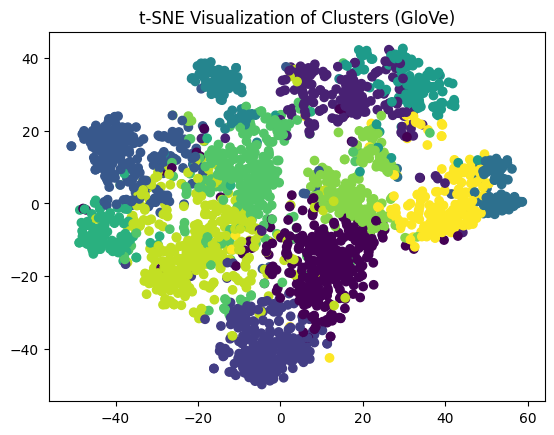

In [45]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Apply t-SNE on GloVe vectors
tsne_glove = TSNE(n_components=2, random_state=42)
tsne_representation_glove = tsne_glove.fit_transform(glove_vectors)

# Scatter plot of clusters
plt.scatter(tsne_representation_glove[:, 0], tsne_representation_glove[:, 1], c=predicted_labels_glove, cmap='viridis')
plt.title("t-SNE Visualization of Clusters (GloVe)")
plt.show()


### Wordcloud for individual categories after stopword removal

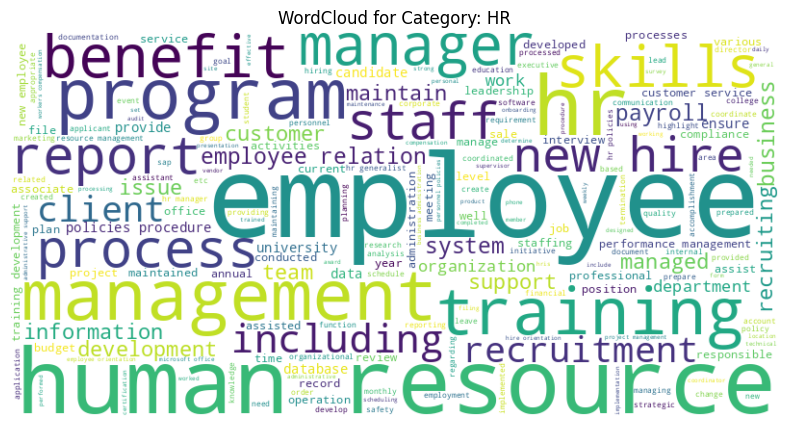

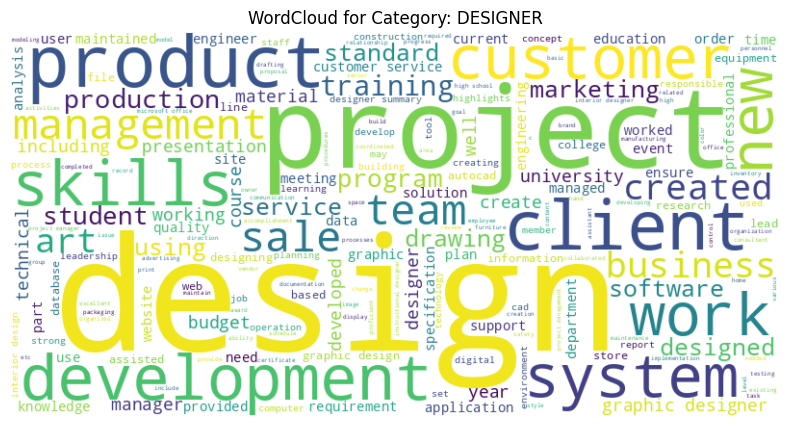

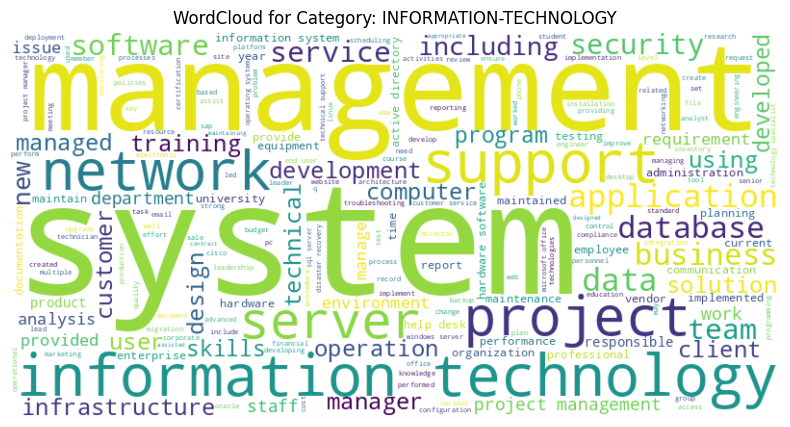

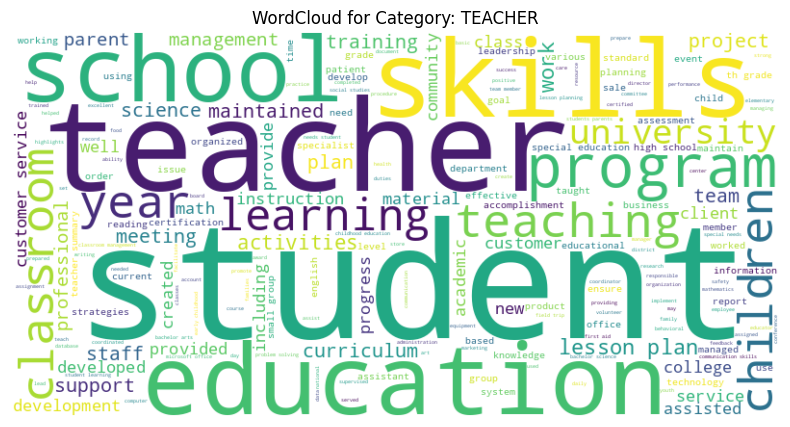

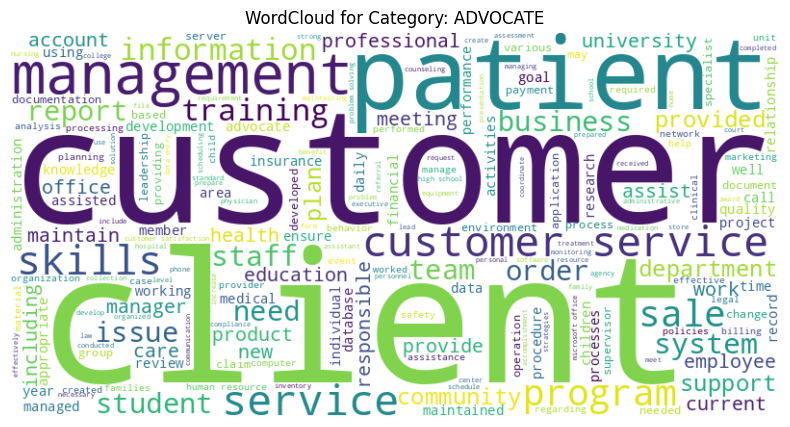

...

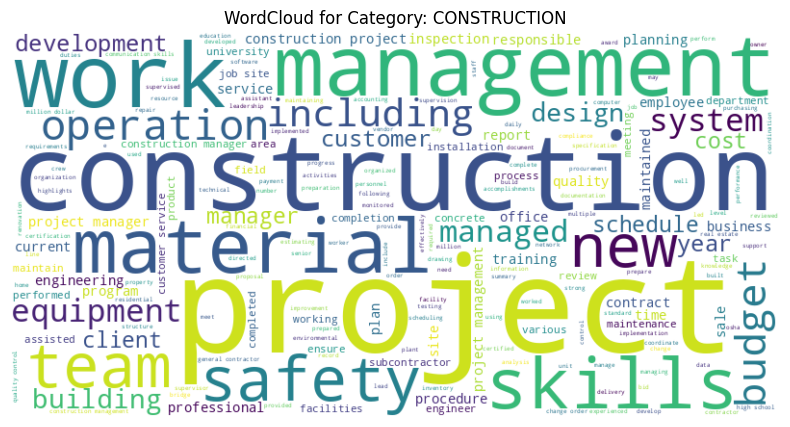

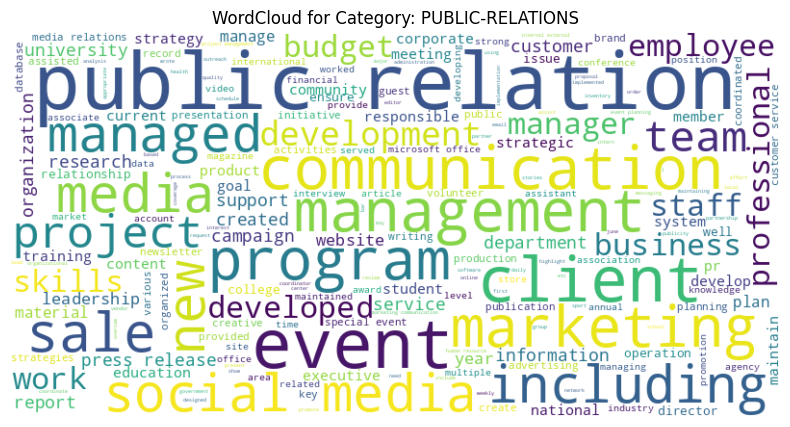

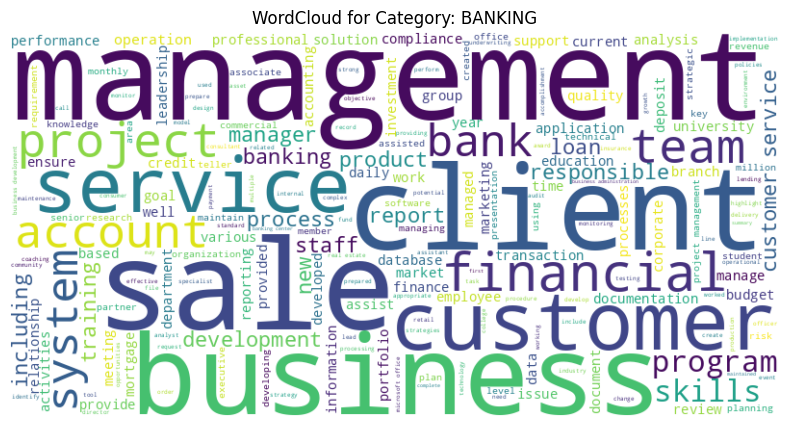

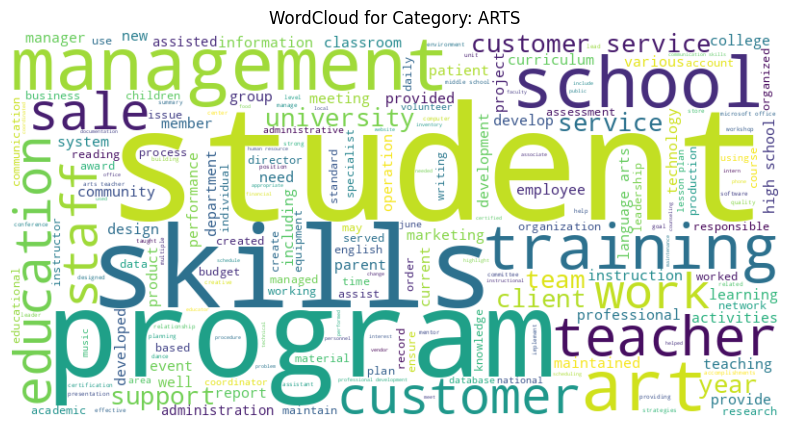

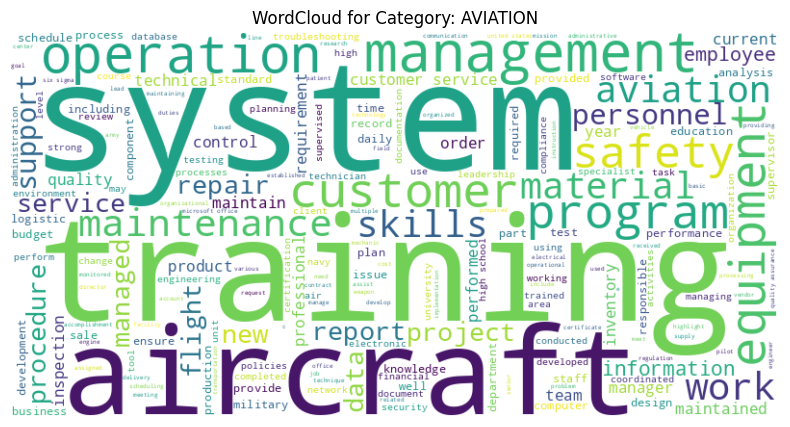

In [46]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Define additional stopwords
custom_stopwords = set(["city", "state", "company", "skill", "experience", "months","Company","name"])

# Combine custom stopwords with the default ones
all_stopwords = set(STOPWORDS).union(custom_stopwords)

# Assuming 'resume_data' contains the preprocessed resume data with 'Category' and 'Feature' columns

# Create a WordCloud for each category
categories = resume_data['Category'].unique()

for category in categories:
    # Filter data for the current category
    category_data = resume_data[resume_data['Category'] == category]

    # Concatenate all text in this category
    text_category = ' '.join(category_data['Feature'])

    # Create WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=all_stopwords).generate(text_category)

    # Plot the WordCloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'WordCloud for Category: {category}')
    plt.axis('off')
    plt.show()
